# Задание 1 (10 баллов)

Придумайте 5 категорий и сгенерируйте по 6 картинок на каждую (всего 30) с помощью генеративной diffusion модели и попытайтесь восстановить изначальное разбиение на категории из эмбеддингов картинок с помощью модели CLIP и любого алгоритма кластеризации. Проанализируйте результаты.

- Категории могут быть абсолютно любыми, главное чтобы они были действительно (по вашему мнению) визуально отличимы друг от друга (примеры: `архитектура`, `собаки`, `машины`, `свитеры`)
- Можете использовать `segmind/SSD-1B` из семинара или какую-то другую модели с huggingface (например, `stabilityai/stable-diffusion-xl-base-1.0`, `stabilityai/stable-diffusion-2-1`).
- каждый промпт должен быть полностью уникальным; внутри одного промпта и из промпта в промпт могут повторяться только предлоги/частицы/артикли; минимальная длина промпта - 10 слов; сохраните все промпты, которые вы использовали
- помимо промпта вам также нужно использовать параметры `guidance_scale`, `negative_prompt`, `height`, `width` (в разных промптах значения должны быть разными)
- используйте `generator = torch.Generator('cuda').manual_seed(12363)` для фиксации random_seed и воспроизводимости (*само значение вы можете подбирать в каждом отдельном случае пока не получится хорошая картинка*)
- сгенерированные картинки не должны быть идеальными, но должны хоть как-то отражать промпт; если у вас получается совсем что-то непонятное, то попытайтесь еще раз с другим seed или остальными параметрами;
- для наглядности напечатайте все картинки, но используйте to_256 из семинара, чтобы не перегружать ноутбук
- можете использовать любую clip модель (например `clip-vit-base-patch32` из семинара) для создания эмбедингов картинок (промпты эмбеддить не нужно)
- можете использовать любой алгоритм кластеризации, но лучше использовать алгоритмы с указанием количества кластеров; в целом постарайтесь получить как можно более хороший результат (даже если кластеризация совсем неверная, должна прослеживаться какая-то логика, результат не должен быть случайным);
- оценивайте качество кластеризации с помощью метрики ARI; лучшую модель разберите визуально - опишите как минимум 3 паттерна (не обязательно корректных), которые модель смогла уловить, а также 3 паттерна (если они есть), которые модель не распознала.

In [ ]:
%pip install opencv-python clip
%pip install git+https://github.com/facebookresearch/segment-anything.git
%pip install matplotlib

  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-kqarembp
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-kqarembp
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done


In [ ]:
!pip install diffusers

In [ ]:
from torchvision import transforms
# это вспомогательные функции чтобы картинки были поменьше
to_512 = transforms.Resize(512)
to_256 = transforms.Resize(256)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
import torch
from diffusers import StableDiffusionXLImg2ImgPipeline, StableDiffusionXLPipeline
from diffusers.utils import load_image
from PIL import Image
from torchvision import transforms
to_512 = transforms.Resize(512)
to_256 = transforms.Resize(256)

In [ ]:
pipe = StableDiffusionXLPipeline.from_pretrained("segmind/SSD-1B", torch_dtype=torch.float16, use_safetensors=True, variant="fp16")
_ = pipe.to("cuda")

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
prompt = 'a cute dog'
# итоговый результат сильно зависит от случайного шума
# для воспроизводимости результатов можно зафиксировать seed и шум будет одинаковый
# и итоговая картинка тоже будет одинаковая при разных запусках
generator = generator=torch.Generator('cuda').manual_seed(12363)

gen_image = pipe(prompt,
             generator=generator,
             height=768, # размер итоговой картинки
             width=1344, # размер итоговой картинки
             guidance_scale=9.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]

  0%|          | 0/20 [00:00<?, ?it/s]

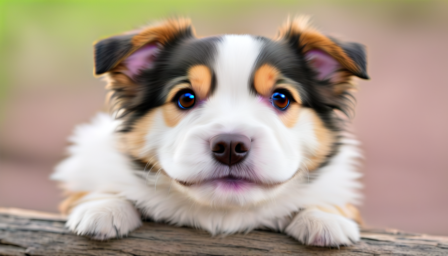

In [ ]:
# seed 12362
to_256(gen_image)

## generation

### 1. dogs

In [ ]:
dogs = []

  0%|          | 0/20 [00:00<?, ?it/s]

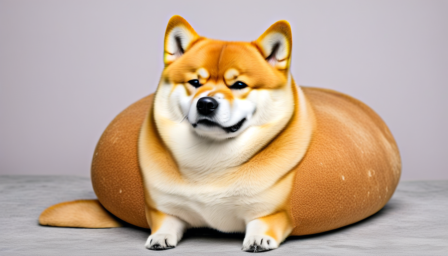

In [ ]:
prompt = 'a huge shiba inu dog looking like a loaf of bread'
gen_image = pipe(prompt,
             generator=generator,
             height=768, # размер итоговой картинки
             width=1344, # размер итоговой картинки
             guidance_scale=9.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
dogs.append(to_256(gen_image))

  0%|          | 0/35 [00:00<?, ?it/s]

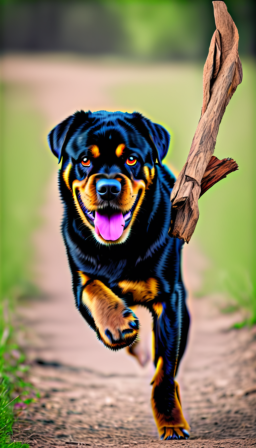

In [ ]:
prompt = 'a big scary rottweiler playfully carrying a stick in his mouth'
gen_image = pipe(prompt,
             generator=generator,
             height=1344, # размер итоговой картинки
             width=768, # размер итоговой картинки
             guidance_scale=12.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=35, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
dogs.append(to_256(gen_image))

  0%|          | 0/22 [00:00<?, ?it/s]

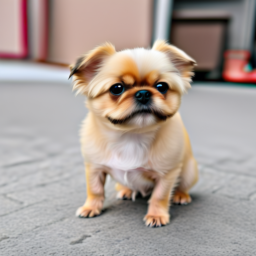

In [ ]:
prompt = 'a very small dog with a flat nose whose owner is a chinese imperor'
gen_image = pipe(prompt,
             generator=generator,
             height=800, # размер итоговой картинки
             width=800, # размер итоговой картинки
             guidance_scale=10.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=22, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
dogs.append(to_256(gen_image))

  0%|          | 0/25 [00:00<?, ?it/s]

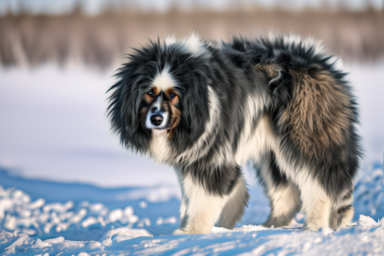

In [ ]:
prompt = 'a Nenets herding dog with a large amount of fur and a curly tail'
gen_image = pipe(prompt,
             generator=generator,
             height=800, # размер итоговой картинки
             width=1200, # размер итоговой картинки
             guidance_scale=11.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=25, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
dogs.append(to_256(gen_image))

  0%|          | 0/35 [00:00<?, ?it/s]

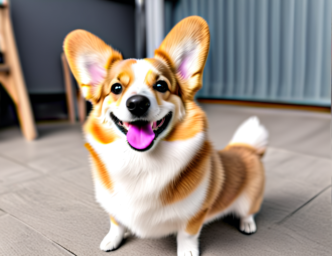

In [ ]:
prompt = 'a very cute corgi with big ears and a smile'
gen_image = pipe(prompt,
             generator=generator,
             height=800, # размер итоговой картинки
             width=1040, # размер итоговой картинки
             guidance_scale=10.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=35, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
dogs.append(to_256(gen_image))

  0%|          | 0/40 [00:00<?, ?it/s]

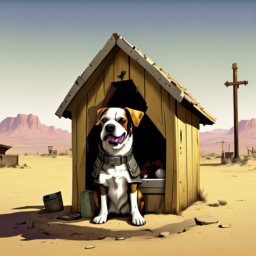

In [ ]:
prompt = 'a dog from follout new vegas in a doghouse'
gen_image = pipe(prompt,
             generator=generator,
             height=960, # размер итоговой картинки
             width=960, # размер итоговой картинки
             guidance_scale=11.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=40, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
dogs.append(to_256(gen_image))

  0%|          | 0/40 [00:00<?, ?it/s]

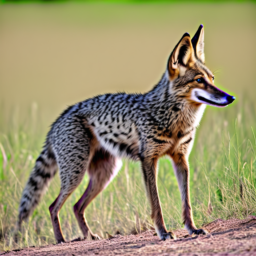

In [ ]:
prompt = 'a hybrid of jackal and layka, very good at sniffing things'
gen_image = pipe(prompt,
             generator=generator,
             height=960, # размер итоговой картинки
             width=960, # размер итоговой картинки
             guidance_scale=11.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=40, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
shalayka = to_256(gen_image)

In [ ]:
dogs

[<PIL.Image.Image image mode=RGB size=448x256>,
 <PIL.Image.Image image mode=RGB size=256x448>,
 <PIL.Image.Image image mode=RGB size=256x256>,
 <PIL.Image.Image image mode=RGB size=384x256>,
 <PIL.Image.Image image mode=RGB size=332x256>,
 <PIL.Image.Image image mode=RGB size=256x256>]

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# def image_grid(array, ncols=4):
#     index, height, width, channels = array.shape
#     nrows = index//ncols

#     img_grid = (array.reshape(nrows, ncols, height, width, channels)
#               .swapaxes(1,2)
#               .reshape(height*nrows, width*ncols, channels))

#     return img_grid

In [ ]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

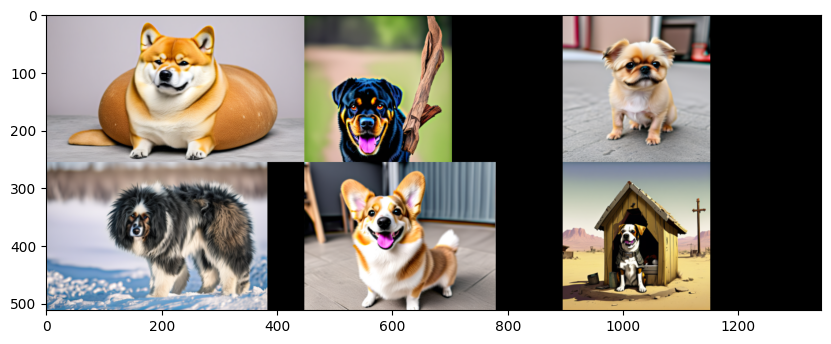

In [ ]:
grid = image_grid(dogs, 2,3)
fig = plt.figure(figsize=(10., 10.))
plt.imshow(grid)

### 2. dinosaurs

In [ ]:
dino = []

  0%|          | 0/33 [00:00<?, ?it/s]

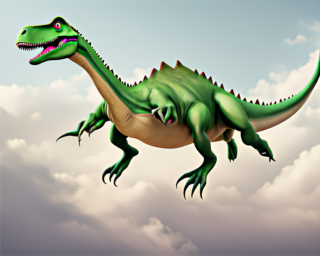

In [ ]:
prompt = 'a flying dinosaur with a very long nose and small eyes'
gen_image = pipe(prompt,
             generator=generator,
             height=960, # размер итоговой картинки
             width=1200, # размер итоговой картинки
             guidance_scale=11.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=33, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
dino.append(to_256(gen_image))

  0%|          | 0/38 [00:00<?, ?it/s]

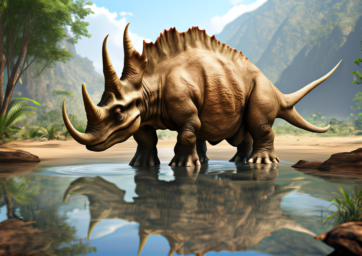

In [ ]:
prompt = 'a beautiful triceratops peacefully drinking water'
gen_image = pipe(prompt,
             generator=generator,
             height=960, # размер итоговой картинки
             width=1360, # размер итоговой картинки
             guidance_scale=10.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=38, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
dino.append(to_256(gen_image))

  0%|          | 0/50 [00:00<?, ?it/s]

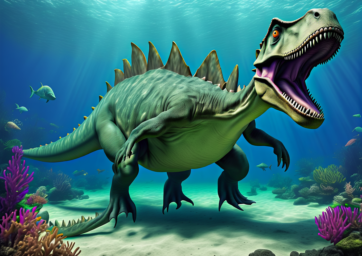

In [ ]:
prompt = 'an enormous underwater dinosaur with 6 flippers'
gen_image = pipe(prompt,
             generator=generator,
             height=960, # размер итоговой картинки
             width=1360, # размер итоговой картинки
             guidance_scale=10.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=50, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
dino.append(to_256(gen_image))

  0%|          | 0/20 [00:00<?, ?it/s]

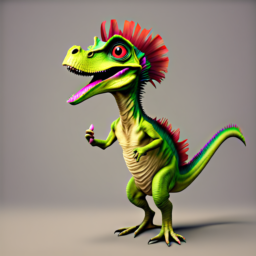

In [ ]:
prompt = 'a small Dilophosaurus who is trying to sing '
gen_image = pipe(prompt,
             generator=generator,
             height=960, # размер итоговой картинки
             width=960, # размер итоговой картинки
             guidance_scale=10.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
dino.append(to_256(gen_image))

  0%|          | 0/27 [00:00<?, ?it/s]

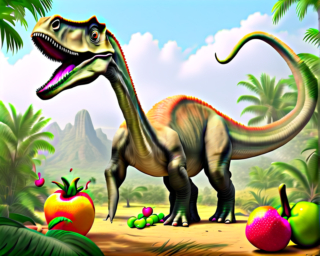

In [ ]:
prompt = 'a Brachiosaurus grabing a fruit with his large tail'
gen_image = pipe(prompt,
             generator=generator,
             height=800, # размер итоговой картинки
             width=1000, # размер итоговой картинки
             guidance_scale=15.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=27, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
dino.append(to_256(gen_image))

  0%|          | 0/60 [00:00<?, ?it/s]

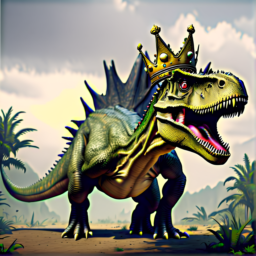

In [ ]:
prompt = 'a big predatory dinosaur with big crown, but he looks intimidated'
gen_image = pipe(prompt,
             generator=generator,
             height=1000, # размер итоговой картинки
             width=1000, # размер итоговой картинки
             guidance_scale=14.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=60, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
dino.append(to_256(gen_image))

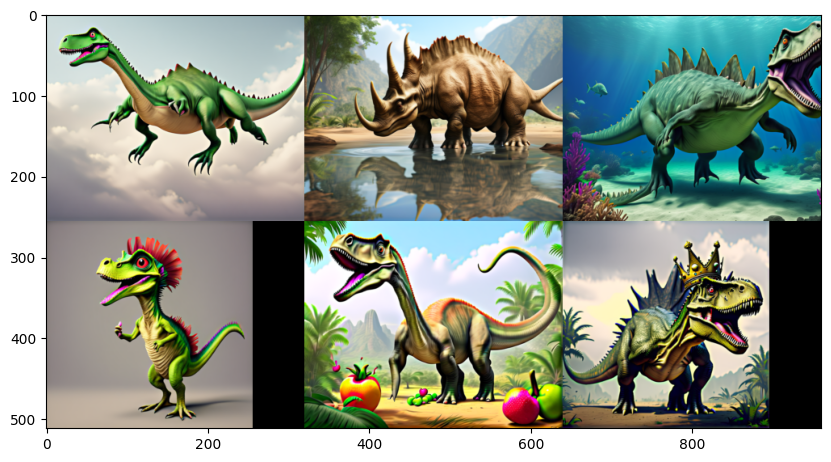

In [ ]:
grid = image_grid(dino, 2,3)
fig = plt.figure(figsize=(10., 10.))
plt.imshow(grid)

### 3. tribal masks

In [ ]:
masks = []

  0%|          | 0/30 [00:00<?, ?it/s]

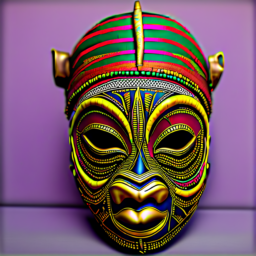

In [ ]:
prompt = 'traditional african mask used for funerals'
gen_image = pipe(prompt,
             generator=generator,
             height=1000, # размер итоговой картинки
             width=1000, # размер итоговой картинки
             guidance_scale=14.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=30, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
masks.append(to_256(gen_image))

  0%|          | 0/20 [00:00<?, ?it/s]

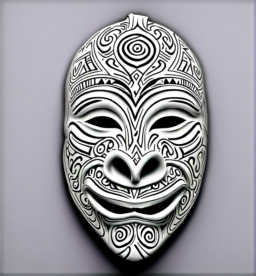

In [ ]:
prompt = 'plain white tribal mask with large mouth and long chin to symbolize authority and strength'
gen_image = pipe(prompt,
             generator=generator,
             height=1080, # размер итоговой картинки
             width=1000, # размер итоговой картинки
             guidance_scale=18.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=20, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
masks.append(to_256(gen_image))

  0%|          | 0/40 [00:00<?, ?it/s]

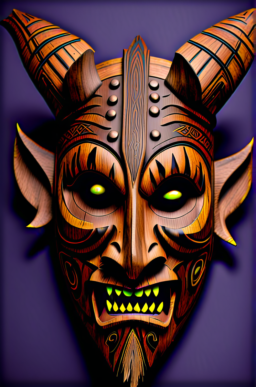

In [ ]:
prompt = 'a very scary wooden tribal mask with horns'
gen_image = pipe(prompt,
             generator=generator,
             height=1200, # размер итоговой картинки
             width=792, # размер итоговой картинки
             guidance_scale=14.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=40, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
masks.append(to_256(gen_image))

  0%|          | 0/45 [00:00<?, ?it/s]

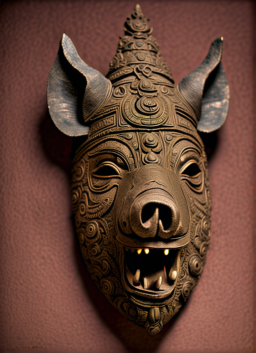

In [ ]:
prompt = 'a mask of the divine spirit of a male wild boar worshipped as a part of Bhuta Kola'
gen_image = pipe(prompt,
             generator=generator,
             height=1160, # размер итоговой картинки
             width=840, # размер итоговой картинки
             guidance_scale=13.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=45, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
masks.append(to_256(gen_image))

  0%|          | 0/45 [00:00<?, ?it/s]

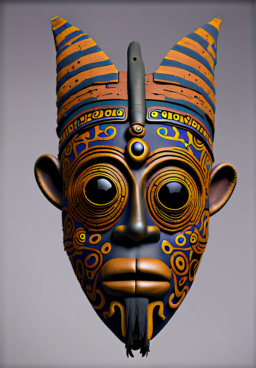

In [ ]:
prompt = 'the Grebo tribe war mask with round eyes to represent alertness and anger'
gen_image = pipe(prompt,
             generator=generator,
             height=1208, # размер итоговой картинки
             width=840, # размер итоговой картинки
             guidance_scale=12.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=45, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
masks.append(to_256(gen_image))

  0%|          | 0/55 [00:00<?, ?it/s]

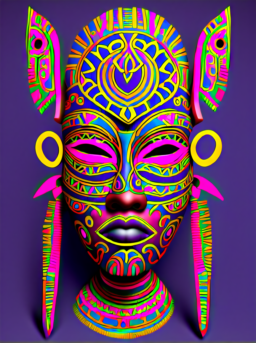

In [ ]:
prompt = 'a tribal mask that represents the female ideal with slit eyes and sweetness of expression'
gen_image = pipe(prompt,
             generator=generator,
             height=1160, # размер итоговой картинки
             width=864, # размер итоговой картинки
             guidance_scale=14.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=55, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
masks.append(to_256(gen_image))

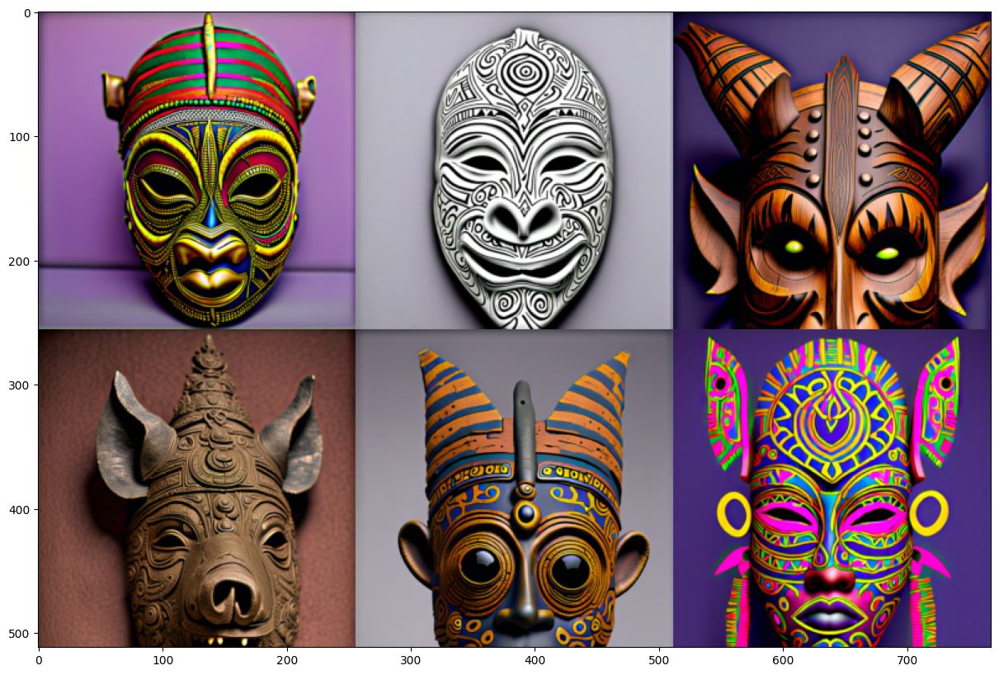

In [ ]:
grid = image_grid(masks, 2,3)
fig = plt.figure(figsize=(20., 10.))
plt.imshow(grid)

### 4. trash bins

In [ ]:
bins = []

  0%|          | 0/40 [00:00<?, ?it/s]

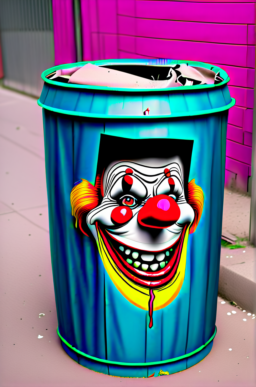

In [ ]:
prompt = 'a funny-looking thrash bin with a clown face'
gen_image = pipe(prompt,
             generator=generator,
             height=1200, # размер итоговой картинки
             width=792, # размер итоговой картинки
             guidance_scale=14.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=40, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
bins.append(to_256(gen_image))

  0%|          | 0/30 [00:00<?, ?it/s]

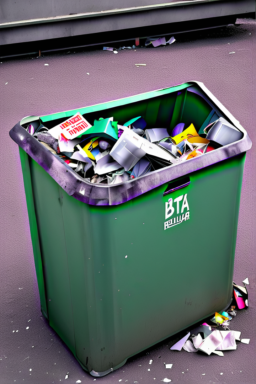

In [ ]:
prompt = 'a refular thrash bin full of garbage'
gen_image = pipe(prompt,
             generator=generator,
             height=1080, # размер итоговой картинки
             width=720, # размер итоговой картинки
             guidance_scale=12.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=30, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
bins.append(to_256(gen_image))

  0%|          | 0/40 [00:00<?, ?it/s]

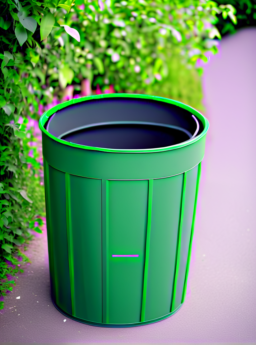

In [ ]:
prompt = 'an eco-friendly, neat trash bin, which is well maintained'
gen_image = pipe(prompt,
             generator=generator,
             height=1080, # размер итоговой картинки
             width=800, # размер итоговой картинки
             guidance_scale=11.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=40, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
bins.append(to_256(gen_image))

  0%|          | 0/45 [00:00<?, ?it/s]

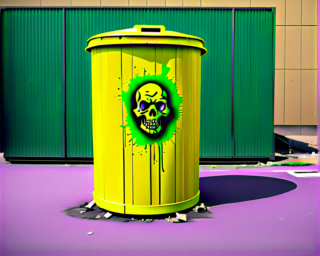

In [ ]:
prompt = 'a very scary trash bin containing dangerous radioactive waste'
gen_image = pipe(prompt,
             generator=generator,
             height=800, # размер итоговой картинки
             width=1000, # размер итоговой картинки
             guidance_scale=15.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=45, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
bins.append(to_256(gen_image))

  0%|          | 0/40 [00:00<?, ?it/s]

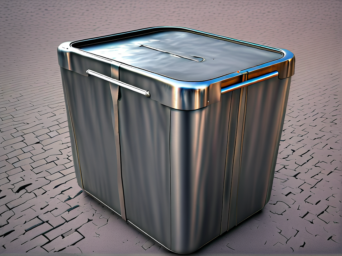

In [ ]:
prompt = 'a metallic russian trash bin, that looks particularly sad'
gen_image = pipe(prompt,
             generator=generator,
             height=808, # размер итоговой картинки
             width=1080, # размер итоговой картинки
             guidance_scale=12.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=40, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
bins.append(to_256(gen_image))

  0%|          | 0/44 [00:00<?, ?it/s]

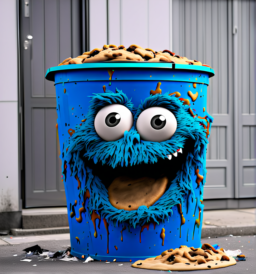

In [ ]:
prompt = 'a thrash bin that looks like a cookie monster from television show Sesame Street'
gen_image = pipe(prompt,
             generator=generator,
             height=1160, # размер итоговой картинки
             width=1080, # размер итоговой картинки
             guidance_scale=11.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=44, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
bins.append(to_256(gen_image))

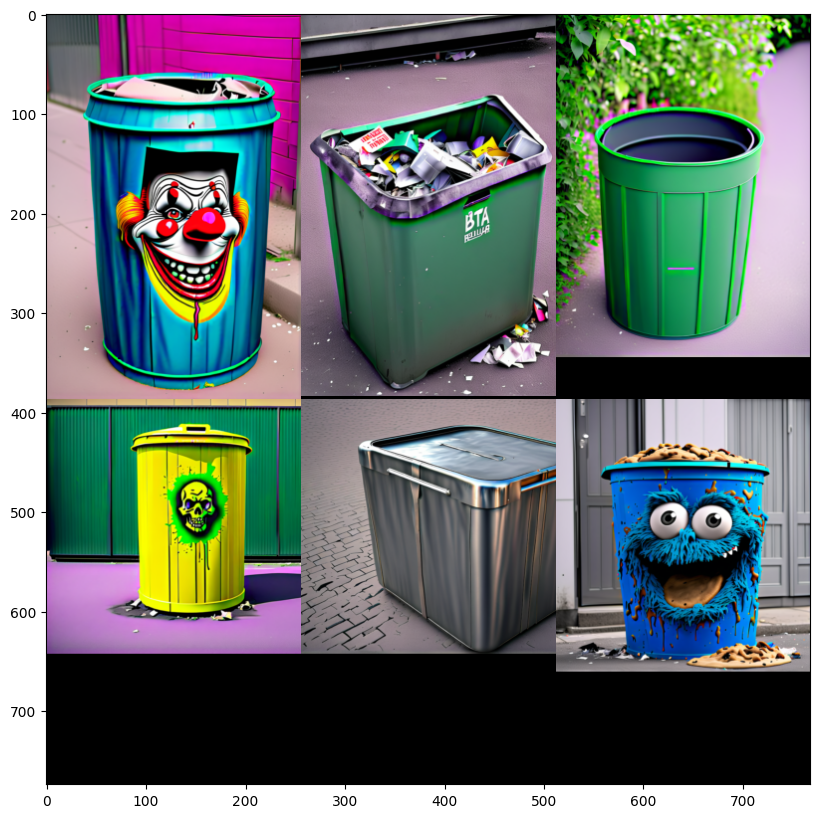

In [ ]:
grid = image_grid(bins, 2,3)
fig = plt.figure(figsize=(10., 10.))
plt.imshow(grid)

## 5. homes

In [ ]:
houses = []

  0%|          | 0/40 [00:00<?, ?it/s]

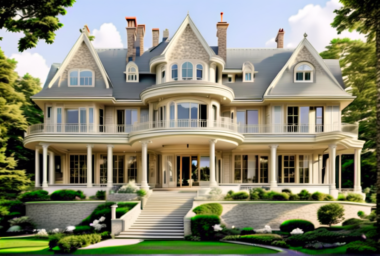

In [ ]:
prompt = 'A beautiful big house wich belongs to disgustingly rich people'
gen_image = pipe(prompt,
             generator=generator,
             height=808, # размер итоговой картинки
             width=1200, # размер итоговой картинки
             guidance_scale=12.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=40, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
houses.append(to_256(gen_image))

  0%|          | 0/43 [00:00<?, ?it/s]

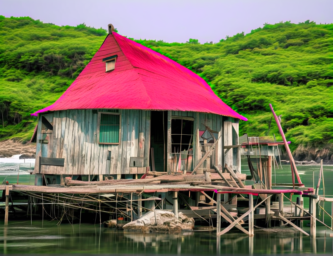

In [ ]:
prompt = 'an old fisherman\'s shack with a red roof'
gen_image = pipe(prompt,
             generator=generator,
             height=920, # размер итоговой картинки
             width=1200, # размер итоговой картинки
             guidance_scale=11.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=43, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
houses.append(to_256(gen_image))

  0%|          | 0/35 [00:00<?, ?it/s]

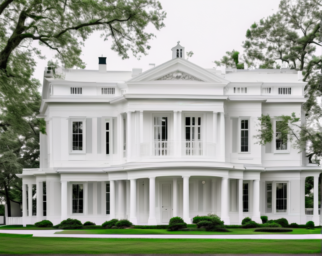

In [ ]:
prompt = 'A white house that belongs to a priest'
gen_image = pipe(prompt,
             generator=generator,
             height=920, # размер итоговой картинки
             width=1160, # размер итоговой картинки
             guidance_scale=9.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=35, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
houses.append(to_256(gen_image))

  0%|          | 0/55 [00:00<?, ?it/s]

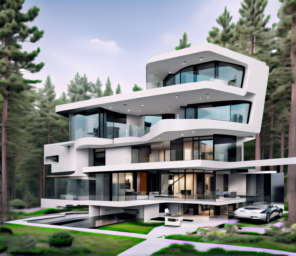

In [ ]:
prompt = 'A high-tech modern house with a lot of surveillance cameras'
gen_image = pipe(prompt,
             generator=generator,
             height=1000, # размер итоговой картинки
             width=1160, # размер итоговой картинки
             guidance_scale=10.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=55, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
houses.append(to_256(gen_image))

  0%|          | 0/40 [00:00<?, ?it/s]

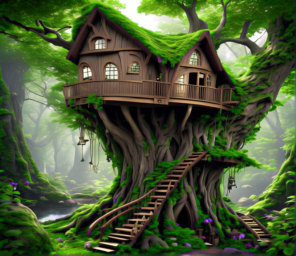

In [ ]:
prompt = 'a cozy tree house where elves could live'
gen_image = pipe(prompt,
             generator=generator,
             height=1000, # размер итоговой картинки
             width=1160, # размер итоговой картинки
             guidance_scale=10.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=40, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
houses.append(to_256(gen_image))

  0%|          | 0/38 [00:00<?, ?it/s]

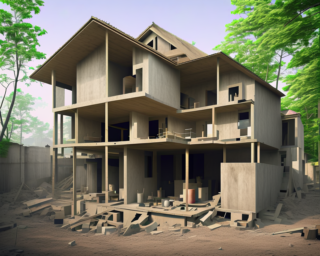

In [ ]:
prompt = 'an unfinished house building of a simple hardworking alcoholic'
gen_image = pipe(prompt,
             generator=generator,
             height=960, # размер итоговой картинки
             width=1200, # размер итоговой картинки
             guidance_scale=11.0, # значимость текстового промпта в диффузии, можно увеличить чтобы было больше похоже на промпт
             num_inference_steps=38, # количество шагов диффузии, чем больше тем лучше, но и дольше; поздние шаги изменяют все меньше и меньше
).images[0]
to_256(gen_image)

In [ ]:
houses.append(to_256(gen_image))

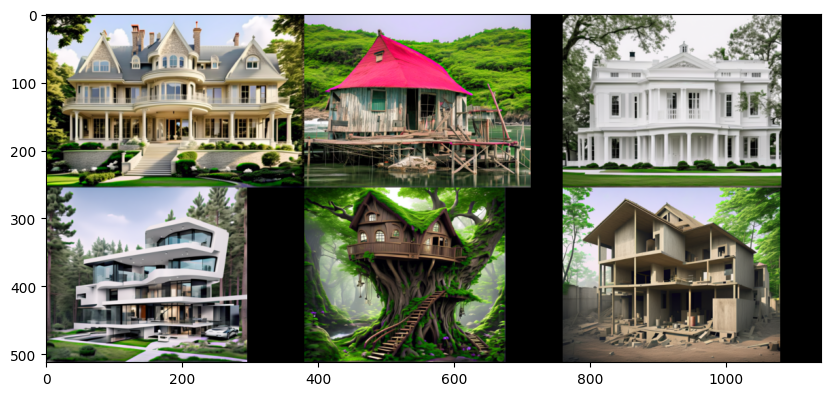

In [ ]:
grid = image_grid(houses, 2,3)
fig = plt.figure(figsize=(10., 10.))
plt.imshow(grid)

## кластеризация

In [ ]:
from PIL import Image
import requests
from transformers import CLIPProcessor, CLIPModel

In [ ]:
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

In [ ]:
images = dogs + dino + bins + houses + masks

In [ ]:
# inputs = processor(images=images[0], return_tensors="pt")
# image_features = model.get_image_features(**inputs)

In [ ]:
images_features = []
for i in images:
  inputs = processor(images=images[0], return_tensors="pt")
  image_features = model.get_image_features(**inputs)
  images_features.append(image_features)

In [ ]:
images_features[0].shape

torch.Size([1, 512])

In [ ]:
data = torch.cat((images_features[0], images_features[1], images_features[2], images_features[3], images_features[4]),0)

In [ ]:
data.shape

torch.Size([5, 512])

In [ ]:
torch.stack(images_features, dim=1).shape

torch.Size([1, 30, 512])

In [ ]:
imgs = torch.vstack(images_features)

In [ ]:
imgs = torch.transpose(imgs, 0, 1)

In [ ]:
imgs.shape

torch.Size([30, 512])

In [ ]:
d = torch.stack(images_features)
d.shape

torch.Size([30, 1, 512])

In [ ]:
!pip install kmeans-pytorch
!pip install torch-kmeans

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21

In [ ]:
#from kmeans_pytorch import kmeans, kmeans_predict
from torch_kmeans import KMeans

In [ ]:
model = KMeans(n_clusters=5)

In [ ]:
# set device
if torch.cuda.is_available():
    device = torch.device('cuda:0')
else:
    device = torch.device('cpu')

In [ ]:
# # k-means
# cluster_ids_x, cluster_centers = kmeans(
#     X=imgs, num_clusters=5, distance='euclidean', device=device
# )

In [ ]:
# print(cluster_ids_x)
# print(cluster_centers)


Это было явно что-то не то, но на этом месте у меня вообще все сломалось, поэтому ниже я вставила код, который, мне кажется, было бы правильно запустить

1. сокращение размерности

from umap import UMAP

umap_model = UMAP(n_components=5)
reduced_embeddings = umap_model.fit_transform(embeddings.cpu().numpy())
print(reduced_embeddings.shape)  

2. собственно кластеризация

from hdbscan import HDBSCAN

clusterer = HDBSCAN(min_cluster_size=2)
clusterer.fit(reduced_embeddings)